### Horses to Zebras.

Based on the previous notebook we are going to make few modifications so by changing from using the `Conv2DTranspose` to the use of the `UpSampling2D` + `Conv2D`.

### Imports

In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras

import os, time
import matplotlib.pyplot as plt
import numpy as np

from prettytable import PrettyTable

AUTOTUNE = tf.data.AUTOTUNE

tf.__version__

'2.5.0'

### Setting memory growth on a GPU.

In the referenced notebook we did not do this.

In [2]:
physical_devices = tf.config.list_physical_devices('GPU')
try:
  tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
  assert 7==8, "failed to set memory growth"
  pass

### Imput pipeline

We are going to preprocess our input by doing the following:

* random jittering, the image is resized to `286 x 286` and then randomly cropped to `256 x 256`.
* random mirroring, the image is randomly flipped horizontally i.e left to right.
* We are going to normalize the image so that each pixel value will be in range `[-1, 1]`.

In [3]:
dataset, metadata = tfds.load(
    'cycle_gan/horse2zebra',
    with_info=True,
    as_supervised=True
)

train_horses, train_zebras = dataset['trainA'], dataset['trainB']
test_horses, test_zebras = dataset['testA'], dataset['testB']

Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incomplete3AIY6F/cycle_gan-trainA.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incomplete3AIY6F/cycle_gan-trainB.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incomplete3AIY6F/cycle_gan-testA.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0.incomplete3AIY6F/cycle_gan-testB.tfrecord


Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/horse2zebra/2.0.0. Subsequent calls will reuse this data.


### Hyper parameters

In [4]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

### Random cropping

In [5]:
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3]
  )
  return cropped_image

### Normalizing images

In [6]:
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

### Random `jittering`

In [7]:
def random_jitter(image):
  image = tf.image.resize(image,[286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
                          )
  image = random_crop(image)
  image = tf.image.random_flip_left_right(image)
  return image

Creating functions that will load the train and test sets. 

**Note:** Only random jittering is applied on the train set only not on the test set. On the test set we are only going to nomilize the images.

In [8]:
def process_image_train(image, label):
  image = random_jitter(image)
  image = normalize(image)
  return image

def process_image_test(image, label):
  return normalize(image)

### Datasets.

In [9]:
train_horses = train_horses.cache().map(
    process_image_train, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

train_zebras = train_zebras.cache().map(
    process_image_train, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

test_horses = test_horses.cache().map(
    process_image_test, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

test_zebras = test_zebras.cache().map(
    process_image_test, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

### Counting examples and tabulate them.

In [10]:
colums_data = "SUBSET", "EXAMPLE(s)"
rows_data = [
             ["training(horses)", f'{len(train_horses):,}'], 
             ["training(zebras)", f'{len(train_zebras):,}'],
             ["testing(horses)", f'{len(test_horses):,}'], 
             ["testing(zebras)", f'{len(test_zebras):,}'],
  ]
title = "TOTAL EXAMPLES FOR ALL SUBSETS"
def tabulate_example(column_names, data, title):
  table = PrettyTable(column_names)
  table.title= title
  table.align[column_names[0]] = 'l'
  table.align[column_names[1]] = 'r'
  for row in data:
    table.add_row(row)
  print(table)
tabulate_example(colums_data, rows_data, title)

+---------------------------------+
|  TOTAL EXAMPLES FOR ALL SUBSETS |
+-------------------+-------------+
| SUBSET            |  EXAMPLE(s) |
+-------------------+-------------+
| training(horses)  |       1,067 |
| training(zebras)  |       1,334 |
| testing(horses)   |         120 |
| testing(zebras)   |         140 |
+-------------------+-------------+


In [11]:
sample_horse = next(iter(train_horses))
sample_zebra = next(iter(train_zebras))

### Plotting images

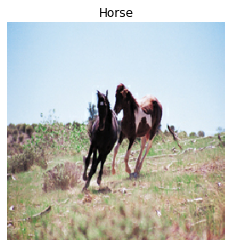

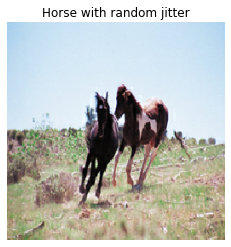

In [12]:
plt.imshow(sample_horse[0] * 0.5 + 0.5, cmap="gray")
plt.title("Horse")
plt.axis('off')
plt.show()

plt.imshow(random_jitter(sample_horse[0]) * 0.5 + 0.5, cmap="gray")
plt.title("Horse with random jitter")
plt.axis('off')
plt.show()

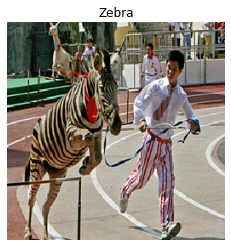

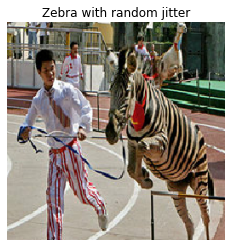

In [13]:
plt.imshow(sample_zebra[0] * 0.5 + 0.5, cmap="gray")
plt.title("Zebra")
plt.axis('off')
plt.show()

plt.imshow(random_jitter(sample_zebra[0]) * 0.5 + 0.5, cmap="gray")
plt.title("Zebra with random jitter")
plt.axis('off')
plt.show()


### Next.

**Instead of importing the `pix2pix` model achitecture from [tensorflow examples](https://github.com/tensorflow/examples) We are going to build our models from skretch.**

The model architecture used in this notebook is very similar to what was used in [pix2pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py). Some of the differences are:

* Cyclegan uses [instance normalization](https://arxiv.org/abs/1607.08022) instead of [batch normalization](https://arxiv.org/abs/1502.03167).

* The [CycleGAN](https://arxiv.org/abs/1703.10593) paper uses a modified resnet based generator. This notebook is using a modified unet generator for simplicity.
There are 2 generators (G and F) and 2 discriminators (X and Y) being trained here.

* Generator `G` learns to transform image `X` to image `Y`. $(G: X -> Y)$
* Generator `F` learns to transform image `Y` to image `X`. $(F: Y -> X)$
* Discriminator `D_X` learns to differentiate between image `X` and generated image `X` (`F(Y)`).
* Discriminator `D_Y` learns to differentiate between image `Y` and generated image `Y` (`G(X)`).

![Cyclegan model](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/cyclegan_model.png?raw=1)

### Instace Normalization.
First we will create an ``InstanceNormalization``Layer from this [paper](https://arxiv.org/abs/1607.08022).

In [14]:
class InstanceNormalization(keras.layers.Layer):
  def __init__(self, epsilon=1e-5):
    super(InstanceNormalization, self).__init__()
    self.epsilon = epsilon

  def build(self, input_shape):
    self.scale = self.add_weight(
        name='scale',
        shape=input_shape[-1:],
        initializer=tf.random_normal_initializer(1., 0.02),
        trainable=True)

    self.offset = self.add_weight(
        name='offset',
        shape=input_shape[-1:],
        initializer='zeros',
        trainable=True)

  def call(self, x):
    mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
    inv = tf.math.rsqrt(variance + self.epsilon)
    normalized = (x - mean) * inv
    return self.scale * normalized + self.offset


### Encoder, (Downsampler)

* **The encoder layer will remain unchanged**

We are going to create a class that will downsample the image from higher resolution to a lower resolution. The structure of the downsampler is as follows:

```py
[ Conv2D ] => [ Batchnorm ] => [ LeakyRelu ]
```

Args:

```
  Args:
    filters: number of filters
    size: filter size
    norm_type: Normalization type; either 'batchnorm' or 'instancenorm'.
    apply_norm: If True, adds the batchnorm layer
```

Return:
```
Downsample Keras Layer
```

In [15]:
class Encoder(keras.layers.Layer):
  def __init__(self, in_features, kernel_size,
               norm_type="batchnorm", apply_norm=True):
    super(Encoder, self).__init__()
    initializer = tf.random_normal_initializer(0., 0.02)

    self.apply_norm = apply_norm

    self.conv = keras.layers.Conv2D(
        in_features, kernel_size = kernel_size, strides=2,
        padding="same",
        kernel_initializer=initializer, use_bias=False
    )

    self.norm = None
    if  norm_type.lower() == 'batchnorm':
      self.norm = keras.layers.BatchNormalization()
    elif norm_type.lower() == 'instancenorm':
       self.norm = InstanceNormalization()
    self.l_relu = keras.layers.LeakyReLU()
    
  def call(self, x):
    x = self.conv(x)
    if self.apply_norm:
      x = self.norm(x)
    return self.l_relu(x)

### Testing the Encoder layer.

In [16]:
down_model = Encoder(3, 4)
down_sampled_horse = down_model(sample_horse)
down_sampled_horse.shape

TensorShape([1, 128, 128, 3])

### Decoder (Upsampler).

**This is where we ar going to change our code a litle bit.** We are going to create a layer called `UpSamplerLayer`. This layer consists of two keras layers which are `Conv2D` and `UpSampling2D`. These two layers when recieve an input x, they will result in an increase in image resolution.


The `UpSamplerLayer` is just a substitution to our keras layer `Conv2DTrasnpose`.

### `UpSamplerLayer`
Args:
```
  Args:
    in_features = number of filters
    kernel_size = filter size (size)
```

Returns:
```
Keras Custom Layer 
  -# this layer is equal to Conv2DTranspose()
```


### `Decoder`

```
[ UpSamplerLayer ] => [ Batchnorm ] => [ Dropout ] => [ ReLu ]
```

Args:
```
  Args:
    filters: number of filters
    size: filter size
    norm_type: Normalization type; either 'batchnorm' or 'instancenorm'.
    apply_dropout: If True, adds the dropout layer
```

Returns:
```
Returns:
    Upsample Keras Layer.
```



In [26]:
class UpSamplerLayer(keras.layers.Layer):
  def __init__(self, in_features, kernel_size):
    super(UpSamplerLayer, self).__init__()
    initializer = tf.random_normal_initializer(0., 0.02)

    self.conv = keras.layers.Conv2D(
      in_features, kernel_size=kernel_size,
      padding="same",
      kernel_initializer= initializer,
      use_bias = False
    )
    self.upsampling_2d = keras.layers.UpSampling2D(size=(2, 2))
  
  def call(self, x):
    x = self.conv(x)
    return self.upsampling_2d(x)

In [27]:
class Decoder(keras.layers.Layer):
  def __init__(self, in_features, kernel_size, 
               norm_type="batchnorm", apply_dropout=False):
    super(Decoder, self).__init__()
  
    self.norm = None
    self.apply_dropout = apply_dropout
    self.upsampler = UpSamplerLayer(in_features, kernel_size)
    if norm_type.lower() == 'batchnorm':
      self.norm = keras.layers.BatchNormalization()
    elif norm_type.lower() == 'instancenorm':
      self.norm = InstanceNormalization()

    self.dropout = keras.layers.Dropout(.5, name="decoder_dropout")
    self.relu = keras.layers.ReLU()
    
  def call(self, x):
    x = self.upsampler(x)
    x = self.norm(x)
    if self.apply_dropout:
      x = self.dropout(x)
    return self.relu(x)

### Testing the decoder layer.

In [28]:
up_model = Decoder(3, 4)
up_sampled_horse = up_model(down_sampled_horse)
up_sampled_horse.shape

TensorShape([1, 256, 256, 3])

### The ``discriminator`` model.

We are going to us the [PatchGan](https://arxiv.org/abs/1611.07004) discriminator. which take the following args:

```
Args:
    norm_type: Type of normalization. Either 'batchnorm' or 'instancenorm'.
    target: Bool, indicating whether target image is an input or not.
```
and returns:

```
Returns:
  Discriminator model
```


In [29]:
def discriminator(norm_type='batchnorm', target=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[None, None, 3], name='input_image')
  x = inp

  if target:
    tar = tf.keras.layers.Input(shape=[None, None, 3], name='target_image')
    x = keras.layers.concatenate([inp, tar], name="concatenated_inputs") # (batch_size, 256, 256, channels*2)
 
  down_1 = Encoder(64, 4, norm_type,  False)(x) # (batch_size, 128, 128, 64)
  down_2 = Encoder(128, 4, norm_type)(down_1)  # (batch_size, 64, 64, 128)
  down_3 = Encoder(256, 4, norm_type)(down_2) # (batch_size, 32, 32, 256)
  zero_pad1 = keras.layers.ZeroPadding2D(name="zero_padding_layer_1")(down_3) # (batch_size, 34, 34, 256)
  
  conv = keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                             use_bias=False,
                             name="conv_layer")(zero_pad1)
  if norm_type.lower() == "batchnorm":
    norm = keras.layers.BatchNormalization(name="batch_norm")(conv)
  elif norm_type.lower() == 'instancenorm':
    norm = InstanceNormalization()(conv)
  
  leaky_relu = keras.layers.LeakyReLU(name="leaky_relu")(norm)

  zero_pad2 = keras.layers.ZeroPadding2D(name="zero_padding_layer_2")(leaky_relu) # (batch_size, 33, 33, 512)
  last = keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer,
                             name="output_layer"
                             )(zero_pad2)  # (batch_size, 30, 30, 1)

  if target:
    return keras.Model(inputs=[inp, tar], outputs=last, name="discriminator_model")
  else:
    return keras.Model(inputs=inp, outputs=last, name="discriminator_model")


In [30]:
discriminator().summary()

Model: "discriminator_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, None, None,  0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, None, None,  0                                            
__________________________________________________________________________________________________
concatenated_inputs (Concatenat (None, None, None, 6 0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
encoder_1 (Encoder)             (None, None, None, 6 6144        concatenated_in

### Plotiing the discriminator model.

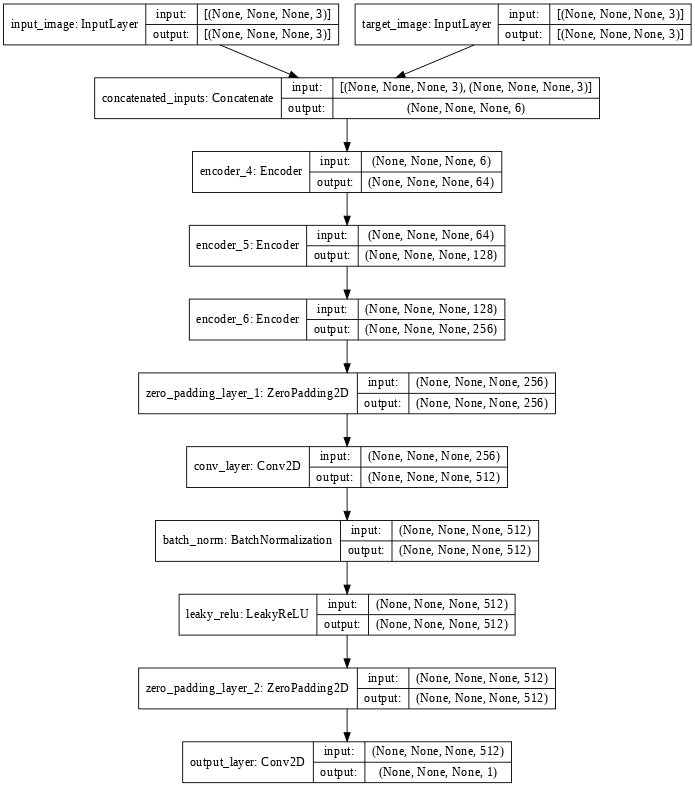

In [31]:
keras.utils.plot_model(discriminator(), show_shapes=True, dpi=64)

### The ``generator`` model.

We are going to build a `unet_generator` based on [this paper](https://arxiv.org/abs/1611.07004) which takes the following args.

Args:
```
Args:
  output_channels: Output channels
  norm_type: Type of normalization. Either 'batchnorm' or 'instancenorm'.
```

Return:
```
  Returns:
    Generator model
```

This generator model is absolutely the same as the one we used in the `pix2pix` series only few changes made.

**Changes to:** creating an instance of `concat` layer outside the skip connection loop

```py
concat = keras.layers.Concatenate()

....

for i, (up, skip) in enumerate(zip(up_stack, skips)):
    x = up(x)
    x = concat([x, skip])
```

**from:** creating an instance of `concat` layer inside the skip connection loop.

```py
for i, (up, skip) in enumerate(zip(up_stack, skips)):
    x = up(x)
    x = keras.layers.Concatenate()([x, skip])
```

In [32]:
def unet_generator(output_channels, norm_type='batchnorm'):
  down_stack = [
      Encoder(64, 4, norm_type, apply_norm=False),  # (bs, 128, 128, 64)
      Encoder(128, 4, norm_type),  # (bs, 64, 64, 128)
      Encoder(256, 4, norm_type),  # (bs, 32, 32, 256)
      Encoder(512, 4, norm_type),  # (bs, 16, 16, 512)
      Encoder(512, 4, norm_type),  # (bs, 8, 8, 512)
      Encoder(512, 4, norm_type),  # (bs, 4, 4, 512)
      Encoder(512, 4, norm_type),  # (bs, 2, 2, 512)
      Encoder(512, 4, norm_type),  # (bs, 1, 1, 512)
  ]

  up_stack = [
      Decoder(512, 4, norm_type, apply_dropout=True),  # (bs, 2, 2, 1024)
      Decoder(512, 4, norm_type, apply_dropout=True),  # (bs, 4, 4, 1024)
      Decoder(512, 4, norm_type, apply_dropout=True),  # (bs, 8, 8, 1024)
      Decoder(512, 4, norm_type),  # (bs, 16, 16, 1024)
      Decoder(256, 4, norm_type),  # (bs, 32, 32, 512)
      Decoder(128, 4, norm_type),  # (bs, 64, 64, 256)
      Decoder(64, 4, norm_type),  # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 4, strides=2,
      padding='same', kernel_initializer=initializer,
      activation='tanh')  # (bs, 256, 256, 3)

  concat = tf.keras.layers.Concatenate()

  inputs = tf.keras.layers.Input(shape=[None, None, 3])
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = concat([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

unet_generator(3).summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
encoder_7 (Encoder)             (None, None, None, 6 3072        input_1[0][0]                    
__________________________________________________________________________________________________
encoder_8 (Encoder)             (None, None, None, 1 131584      encoder_7[0][0]                  
__________________________________________________________________________________________________
encoder_9 (Encoder)             (None, None, None, 2 525312      encoder_8[0][0]                  
______________________________________________________________________________________________

### Plotting the model.


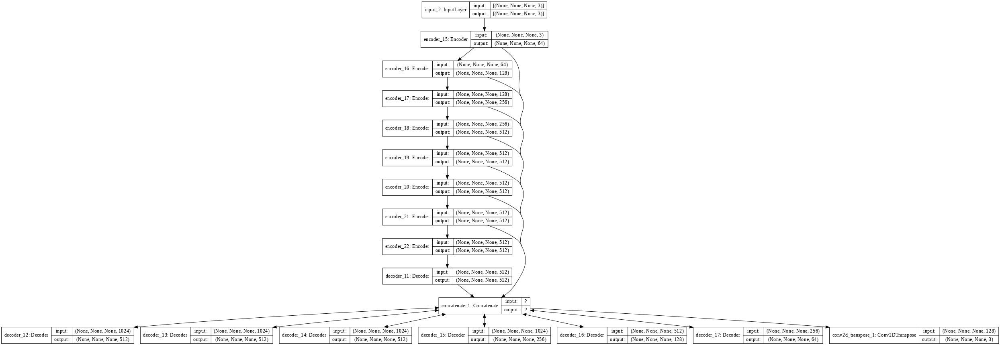

In [33]:
keras.utils.plot_model(unet_generator(3), show_shapes=True, dpi=64)

#### Initializing generators and discriminators.

In [34]:
OUTPUT_CHANNELS = 3

generator_g = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = discriminator(norm_type='instancenorm', target=False)
discriminator_y = discriminator(norm_type='instancenorm', target=False)

In [35]:
generator_f.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
encoder_31 (Encoder)            (None, None, None, 6 3072        input_4[0][0]                    
__________________________________________________________________________________________________
encoder_32 (Encoder)            (None, None, None, 1 131328      encoder_31[0][0]                 
__________________________________________________________________________________________________
encoder_33 (Encoder)            (None, None, None, 2 524800      encoder_32[0][0]                 
____________________________________________________________________________________________

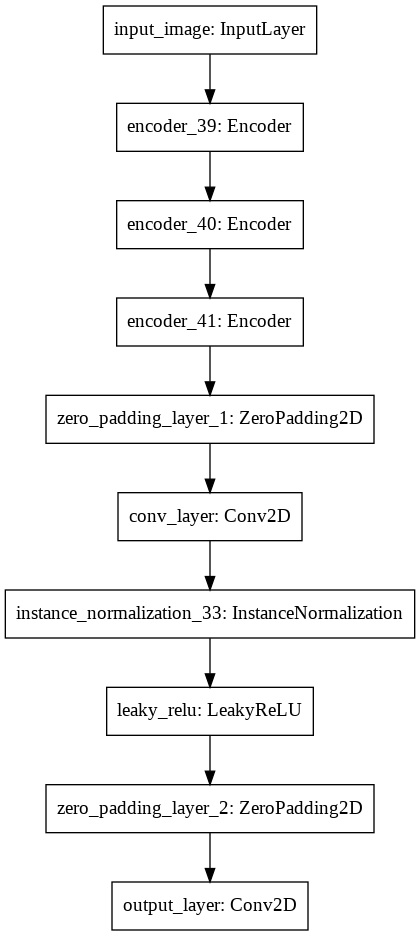

In [ ]:
tf.keras.utils.plot_model(discriminator_x)

### Testing the generator.


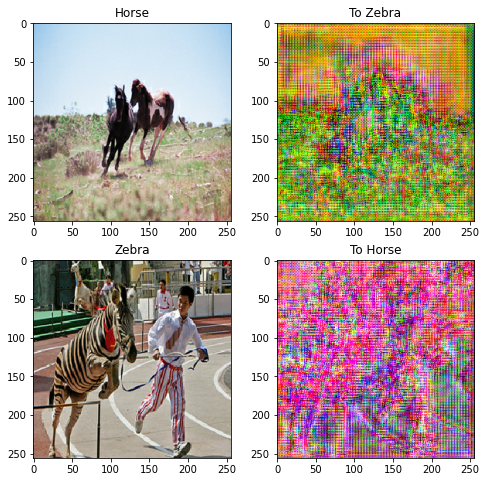

In [36]:
to_zebra = generator_g(sample_horse)
to_horse = generator_f(sample_zebra)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_horse, to_zebra, sample_zebra, to_horse]
title = ['Horse', 'To Zebra', 'Zebra', 'To Horse']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

### Testing the discriminator.

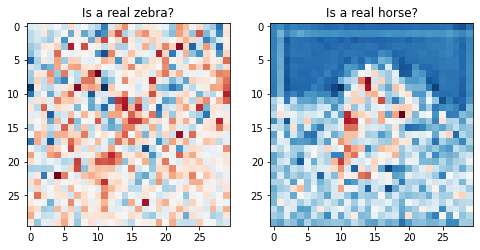

In [37]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real zebra?')
plt.imshow(discriminator_y(sample_zebra)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real horse?')
plt.imshow(discriminator_x(sample_horse)[0, ..., -1], cmap='RdBu_r')

plt.show()

### Loss functions

In [38]:
LAMBDA = 10
criterion = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
  real_loss = criterion(tf.ones_like(real), real)
  generated_loss = criterion(tf.zeros_like(generated), generated)
  total_disc_loss = real_loss + generated_loss
  return total_disc_loss * .5

def generator_loss(generated):
  return criterion(tf.ones_like(generated), generated)

### calc_cycle_loss


In [39]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  return LAMBDA * loss1

### Identity loss

In [40]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * .5 * loss

### Optimizers

In [41]:
generator_g_optimizer = generator_f_optimizer = tf.keras.optimizers.Adam(
    2e-4, beta_1 = .5
)

discriminator_x_optimizer = discriminator_y_optimizer = tf.keras.optimizers.Adam(
    2e-4, beta_1 = .5
)

### Checkpoints

In [42]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

### Training.

In this notebook we will train for fewer epochs to see if it works. You are free to go ahead and train for more epochs.

In [43]:
EPOCHS = 10

In [44]:
def generated_images(model, test_input):
  prediction = model(test_input)
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']
  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

### `train_step`

In [45]:
@tf.function
def train_step(real_x, real_y):
  """
  persistent is set to True because the tape is used more than once to calculate the gradients.
  """
  with tf.GradientTape(persistent=True) as tape:
    """
    Generator G translates X -> Y
    Generator F translates Y -> X.
    """
    fake_y = generator_g(real_x, training=True)
    cycled_y = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_x = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    """
    calculate the losses.
    """
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # Calculate the gradients of the generator and discriminator
  gradients_of_generator_g = tape.gradient(total_gen_g_loss,
                                           generator_g.trainable_variables
                                           )
  gradients_of_generator_f = tape.gradient(total_gen_f_loss,
                                           generator_f.trainable_variables
                                           )
  gradients_of_discriminator_x = tape.gradient(
      disc_x_loss,
      discriminator_x.trainable_variables
  )
  gradients_of_discriminator_y = tape.gradient(
      disc_y_loss,
      discriminator_y.trainable_variables
  )

  # Update the weights by applying the gradients.

  generator_g_optimizer.apply_gradients(
      zip(gradients_of_generator_g, generator_g.trainable_variables)
  )
  generator_f_optimizer.apply_gradients(
      zip(gradients_of_generator_f, generator_f.trainable_variables)
  )
  discriminator_x_optimizer.apply_gradients(
      zip(gradients_of_discriminator_x, discriminator_x.trainable_variables)
  )
  discriminator_y_optimizer.apply_gradients(
      zip(gradients_of_discriminator_y, discriminator_y.trainable_variables)
  )

  return gen_g_loss, gen_f_loss, disc_x_loss, disc_y_loss
  

### Helper functions
1. time to string


In [46]:
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)

2. tabulate training epoch

In [47]:
def tabulate_training_epochs(column_names, data, title):
  table = PrettyTable(column_names)
  table.title= title
  table.align[column_names[0]] = 'l'
  table.align[column_names[1]] = 'r'
  table.align[column_names[2]] = 'r'
  table.align[column_names[3]] = 'r'
  table.align[column_names[4]] = 'r'
  table.align[column_names[5]] = 'r'
  for row in data:
    table.add_row(row)
  print(table)

3. fit()

In [48]:
def fit(train_horses, train_zebras, epochs):
  columns_data =["EPOCH", "ETA", "GEN_G_LOSS", "GEN_F_LOSS", "DISC_X_LOSS","DISC_Y_LOSS"]
  print("Training start....")
  for epoch in range (epochs):
    start = time.time()
    n = 0
    gen_g_loss, gen_f_loss, disc_x_loss, disc_y_loss = 0, 0, 0, 0
    for image_x, image_y in tf.data.Dataset.zip((train_horses, train_zebras)):
      g_loss, f_loss, x_loss, y_loss = train_step(image_x, image_y)

      gen_g_loss +=g_loss
      gen_f_loss += f_loss
      disc_x_loss += x_loss
      disc_y_loss += y_loss
      n += 1
    end = time.time()
    if (epoch + 1) % 10 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                            ckpt_save_path))
    rows_data = [
       [epoch+1, hms_string(end - start),
        f'{(gen_g_loss/n):.3f}',
        f'{(gen_f_loss/n):.3f}',
        f'{(disc_x_loss/n):.3f}',
        f'{(disc_y_loss/n):.3f}'
        ],      
    ]
    title = f'EPOCH:  {epoch+1:02}/{epochs} {"display" if epoch == 0 or (epoch+1)%10 == 0 else "no display"}'
    if epoch == 0 or (epoch+1) % 2 == 0:
      # Using a consistent image (sample_horse) so that the progress of the model is clearly visible.
      generated_images(generator_g, sample_horse)
    tabulate_training_epochs(columns_data, rows_data, title)
    

### Running the training loop.

Training start....


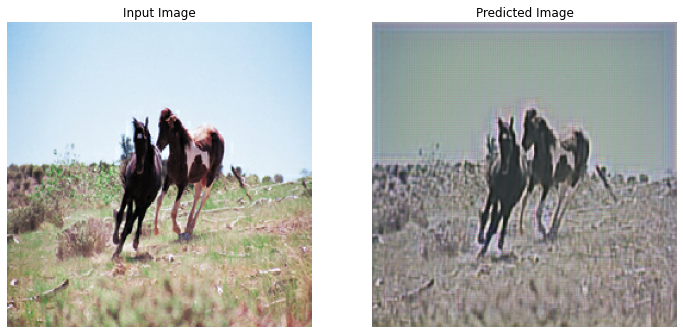

+--------------------------------------------------------------------------+
|                          EPOCH:  01/10 display                           |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 1     | 0:15:49.57 |      1.822 |      0.968 |       0.644 |       0.442 |
+-------+------------+------------+------------+-------------+-------------+


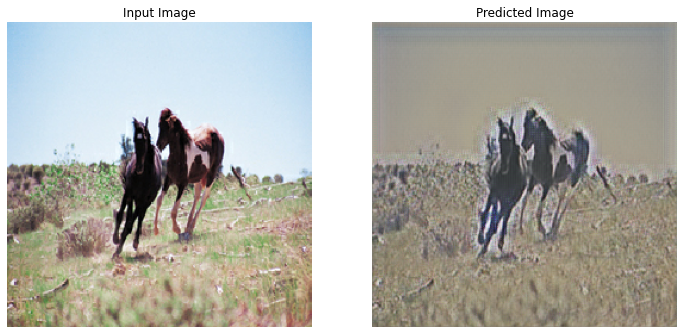

+--------------------------------------------------------------------------+
|                         EPOCH:  02/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 2     | 0:15:20.55 |      1.706 |      1.316 |       0.537 |       0.438 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  03/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 3     | 0:15:22.14 |      1.897 |      1.299 |       0.541 |       0.387 |

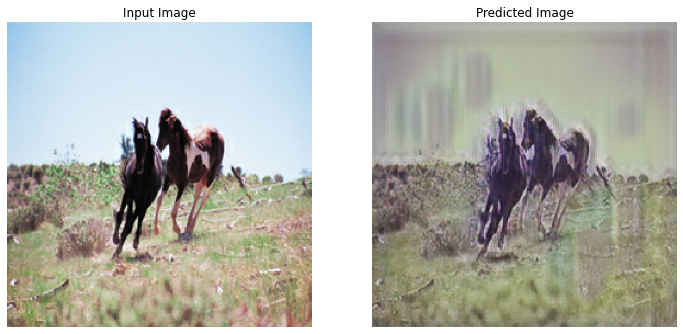

+--------------------------------------------------------------------------+
|                         EPOCH:  04/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 4     | 0:15:19.50 |      2.108 |      1.481 |       0.480 |       0.354 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  05/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 5     | 0:15:17.52 |      2.164 |      1.590 |       0.469 |       0.339 |

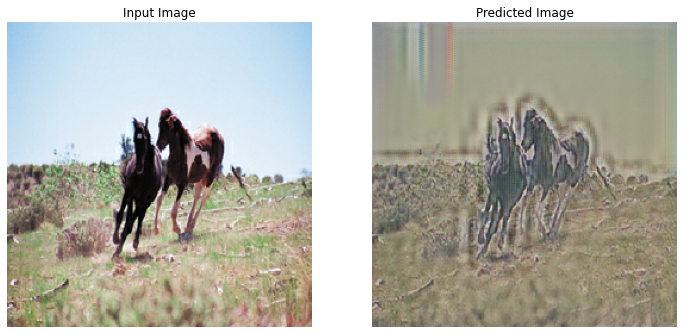

+--------------------------------------------------------------------------+
|                         EPOCH:  06/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 6     | 0:15:17.17 |      2.184 |      1.718 |       0.440 |       0.345 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  07/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 7     | 0:15:17.43 |      2.167 |      1.687 |       0.455 |       0.345 |

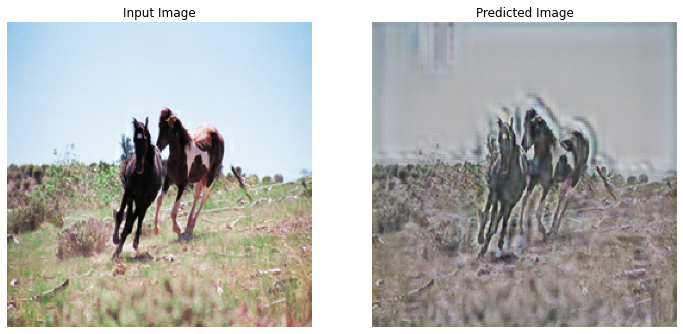

+--------------------------------------------------------------------------+
|                         EPOCH:  08/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 8     | 0:15:18.48 |      2.123 |      1.716 |       0.434 |       0.351 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  09/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 9     | 0:15:14.51 |      2.110 |      1.732 |       0.447 |       0.348 |

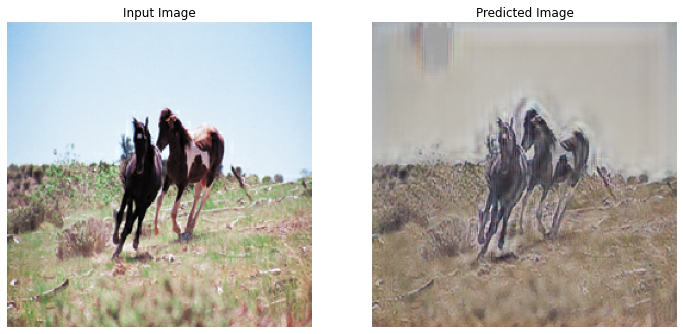

+--------------------------------------------------------------------------+
|                          EPOCH:  10/10 display                           |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 10    | 0:15:15.22 |      2.129 |      1.773 |       0.433 |       0.331 |
+-------+------------+------------+------------+-------------+-------------+


In [49]:
fit(train_horses, train_zebras, EPOCHS)

### Generating images from the train_set

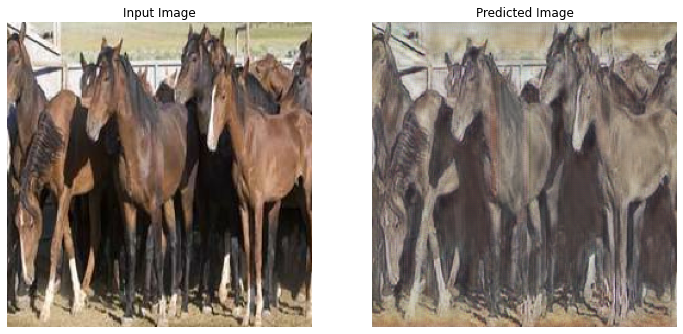

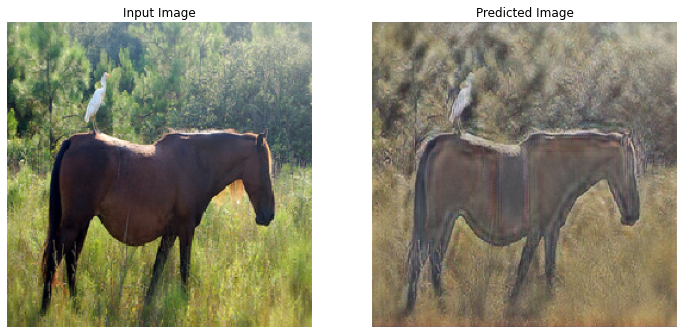

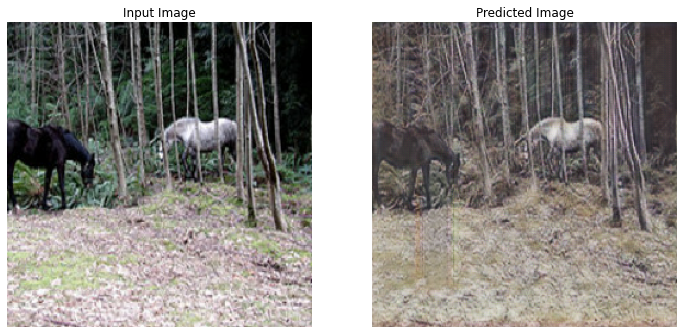

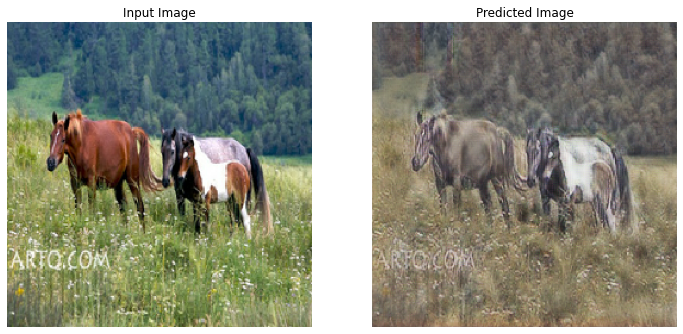

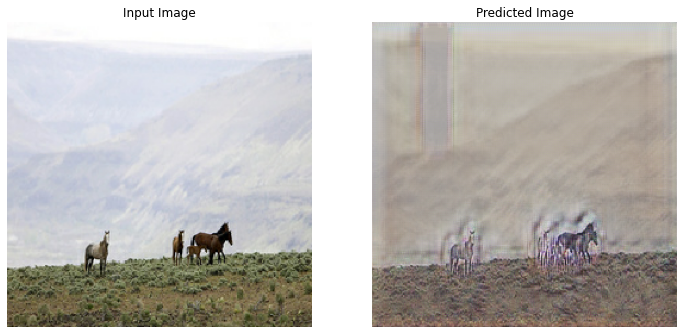

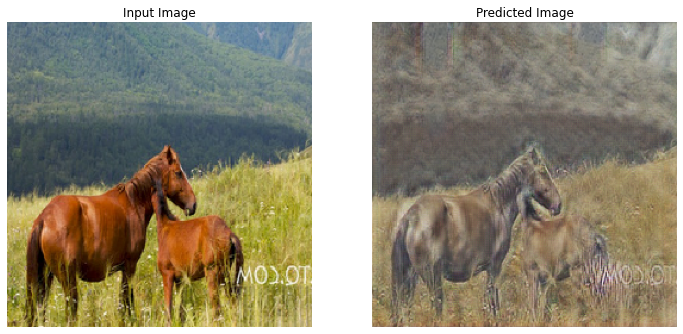

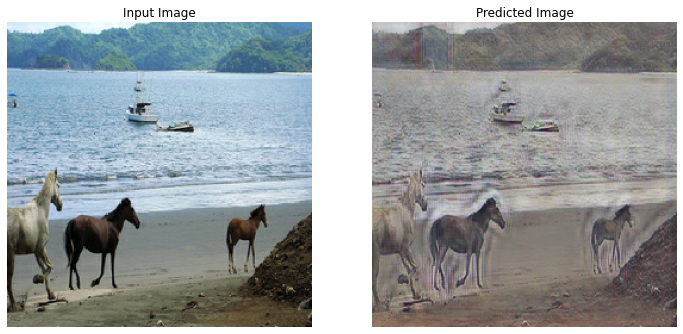

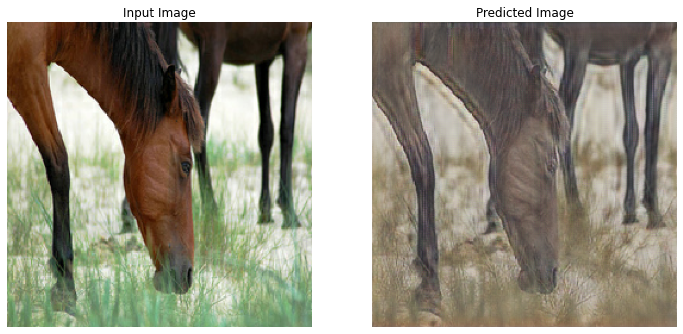

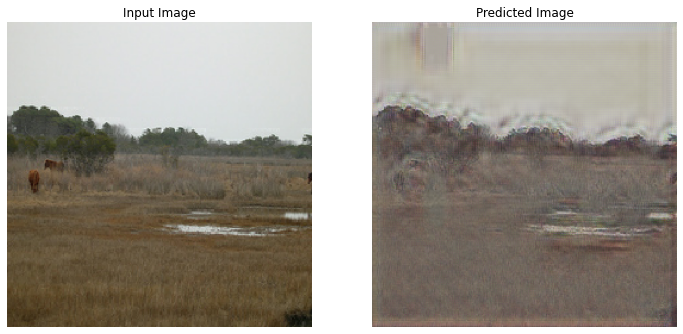

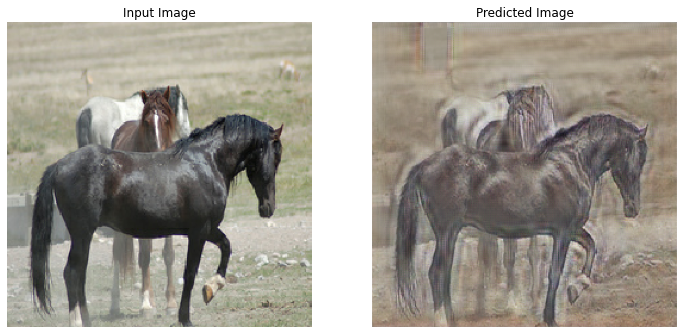

In [52]:
for inp in train_horses.take(10):
  generated_images(generator_g, inp)

### Generating images from the test dataset.

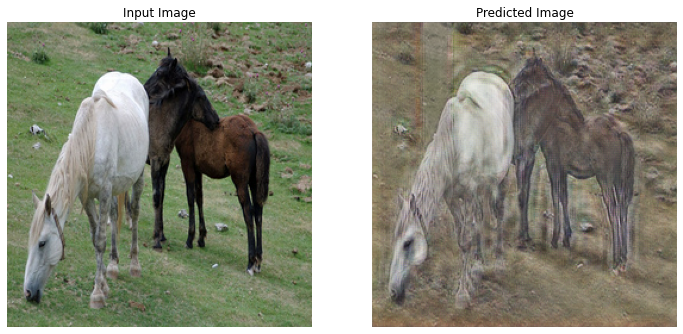

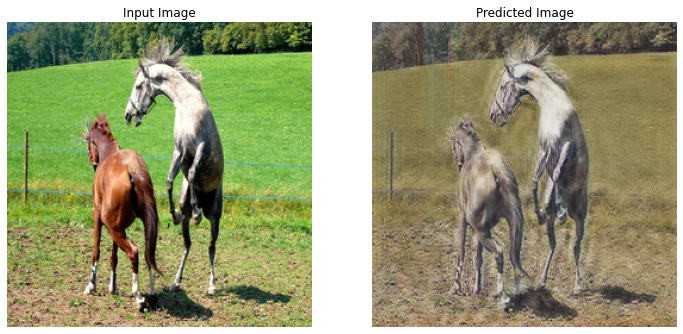

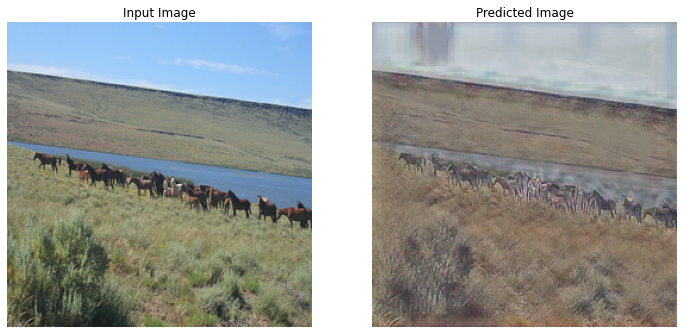

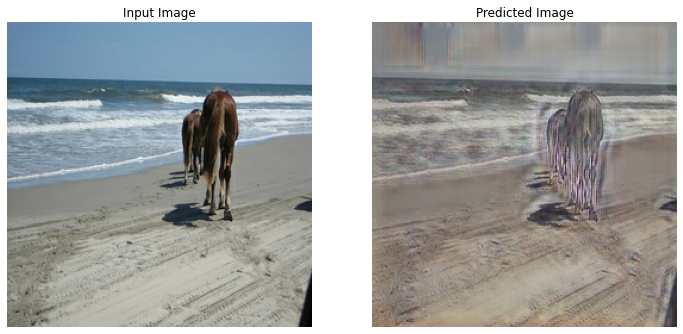

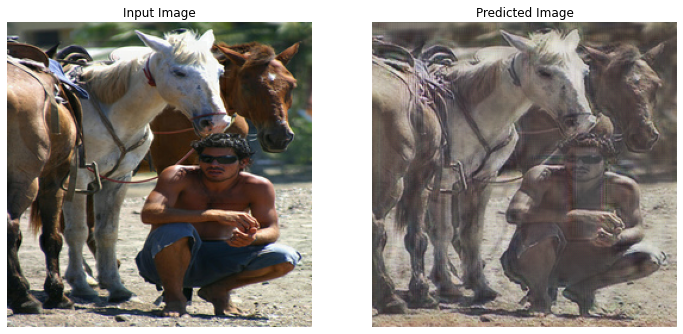

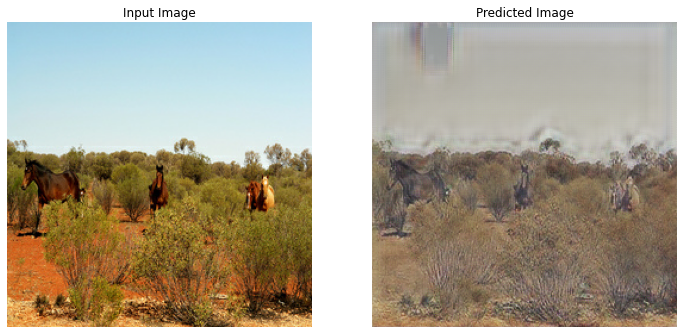

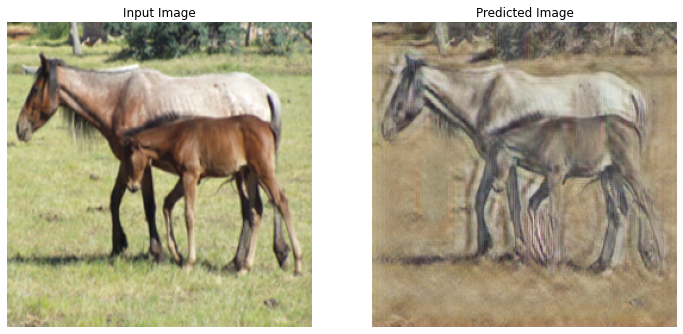

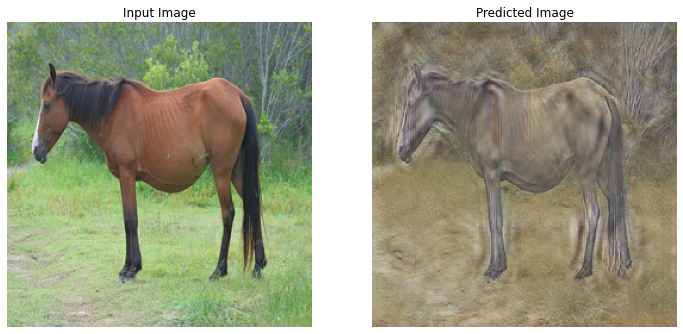

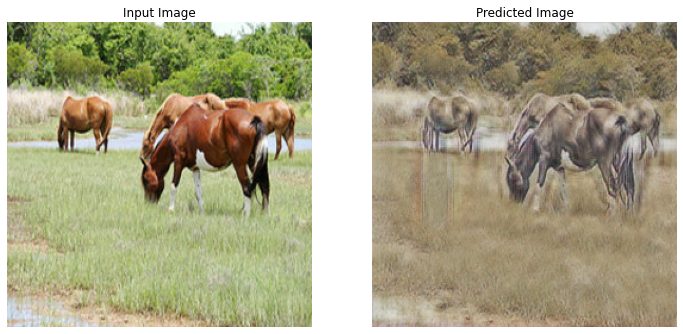

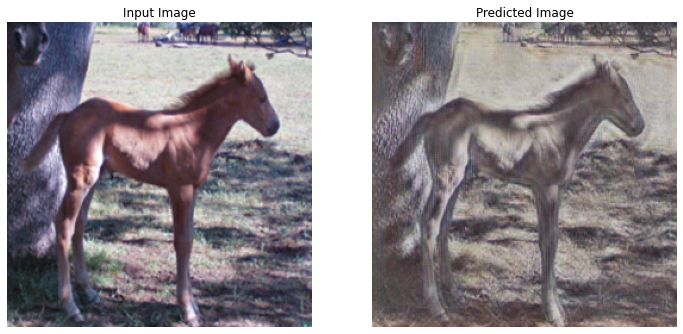

In [53]:
for inp in test_horses.take(10):
  generated_images(generator_g, inp)

### Conclusion
We can be able to see that this model is not doing it's task. The surprising part is that. This model is the same as the previous trained and worked model. But why didn't this model work? We will look at what causes this and how we can make it work.

### What's next?

1. We will learn how to load our own images and create a NN that will generates images.

### Resources Used.

* [pix2pix tensorflow](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py)
* [this notebook](https://github.com/CrispenGari/keras-api/blob/main/13_GANs/03_CycleGAN/01_Introduction_From_Tensorflow_Tutorial.ipynb)